Programmer: Samantha Gregoryk     
Class: CptS 215-01, Fall 2019     
Mirco Assignment #7   
12/4/2019   
 
Description: In this assignment, we are analyzing lists and matrices and how to form them in the graphs. Then, we are applying these methods to the breadth first search in order to find the shortest path between vertices by finding the shortest path of edges.  

# [CptS 215 Data Analytics Systems and Algorithms](https://piazza.com/wsu/fall2017/cpts215/home)
[Washington State University](https://wsu.edu)

[Gina Sprint](http://eecs.wsu.edu/~gsprint/)
## MA7 Graph Practice (50 pts)
<mark>Due:</mark>

### Learner Objectives
At the conclusion of this micro assignment, participants should be able to:
* Implement/analyze graphs
* Traverse graphs

### Prerequisites
Before starting this micro assignment, participants should be able to:
* Write Markdown and code cells in Jupyter Notebook
* Perform algorithm analysis

### Acknowledgments
Content used in this assignment is based upon information in the following sources:
* [Data Structures: Abstraction and Design Using Java](http://www.wiley.com/WileyCDA/WileyTitle/productCd-EHEP001607.html) by Koffman and Wolfgang
* [Miller and Ranum](https://runestone.academy/runestone/books/published/pythonds/Graphs/DiscussionQuestions.html)

## Overview and Requirements
For this micro assignment, you are going to download this Jupyter Notebook and answer the following questions. Your answer for a problem should be in a cell *immediately* after the problem cell. *Do not modify the problem cell.*

We are going to solve several problems related to graphs and their efficiency. This micro assignment includes conceptional questions and programming.

### Conceptual Questions
Solve the following problems and *justify* your answers:

|from|to|cost|
|-|-|-|
|1	|2|	10|
|1	|3|	15|
|1	|6|	5|
|2	|3|	7|
|3	|4|	7|
|3	|6|	10|
|4	|5|	7|
|6	|4|	5|
|5	|6|	13|
1. (2 pts) Draw the graph corresponding to the above list of edges.
1. (2 pts) Draw the graph corresponding to the following adjacency matrix:
<img src="https://runestone.academy/runestone/books/published/pythonds/_images/adjMatEX.png" width="350"/>
(image from [https://runestone.academy/runestone/books/published/pythonds/_images/adjMatEX.png](https://runestone.academy/runestone/books/published/pythonds/_images/adjMatEX.png))

<div>
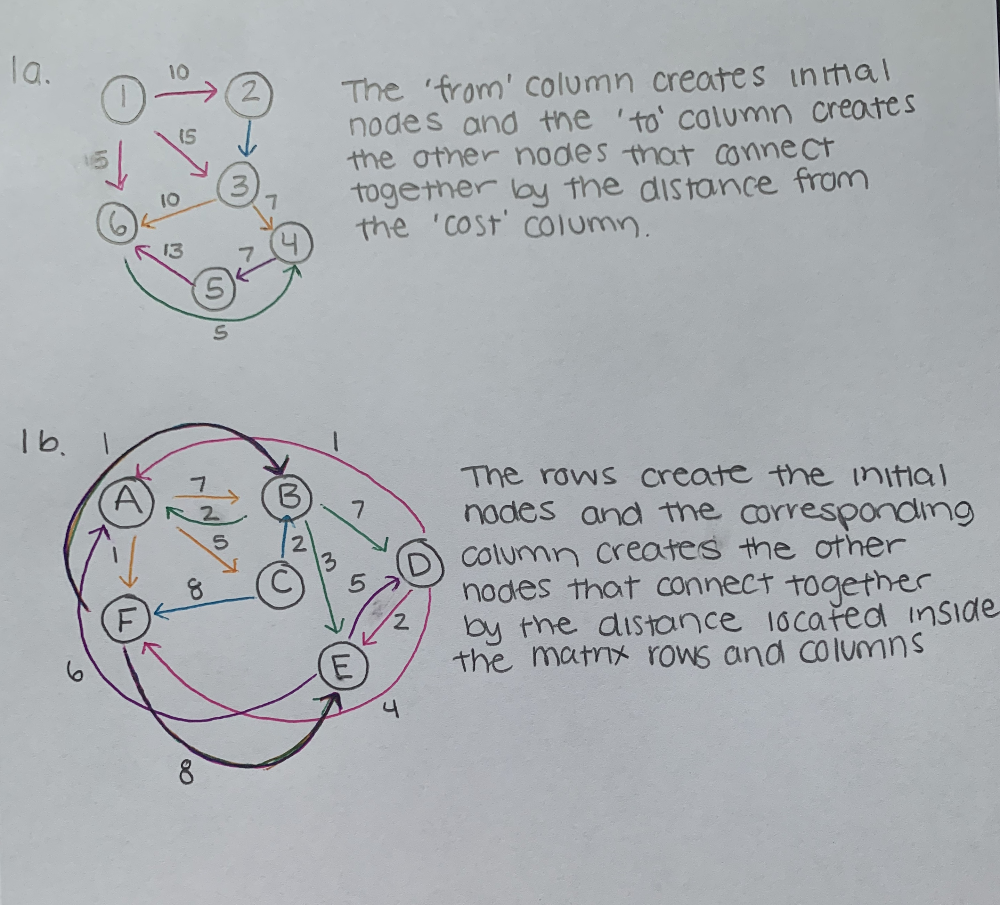
</div>

For the following digraph:
<img src="https://raw.githubusercontent.com/gsprint23/cpts215/master/microassignments/figures/ma7_digraph.png" width="400"/>
1. (2 pts) List the vertices.  
1. (2 pts) List the edges.    
1. (2 pts) Does this graph contain any cycles?    
1. (2 pts) Show the adjacency matrix.    
1. (2 pts) Show the adjacency list.    
1. Starting at vertex 0, list the vertices in the graph in the order they would be visited during a:   
    1. (2 pts) Breadth-first traversal.    
    1. (2 pts) Depth-first traversal.    
1. (2 pts) Starting at vertex 0, show the breadth-first search tree subgraph.    
1. (2 pts) Starting at vertex 0, show the depth-first search tree subgraph.    
1. (2 pts) What is the time complexity for breadth-first search and for depth-first search?    
1. (4 pts) For the following weighted digraph, find the shortest path from 0 to all other vertices.    

1. vertices: {0,1,2,3,4,5,6,7}

2. edges: {0-1, 0-3, 0-5, 1-2, 2-4, 3-4, 4-7, 5-3, 5-6, 6-7}

3. cylces? there are no cycles because there are no back edges, which means that the  edges do not repeat itself backwards. 

<div>
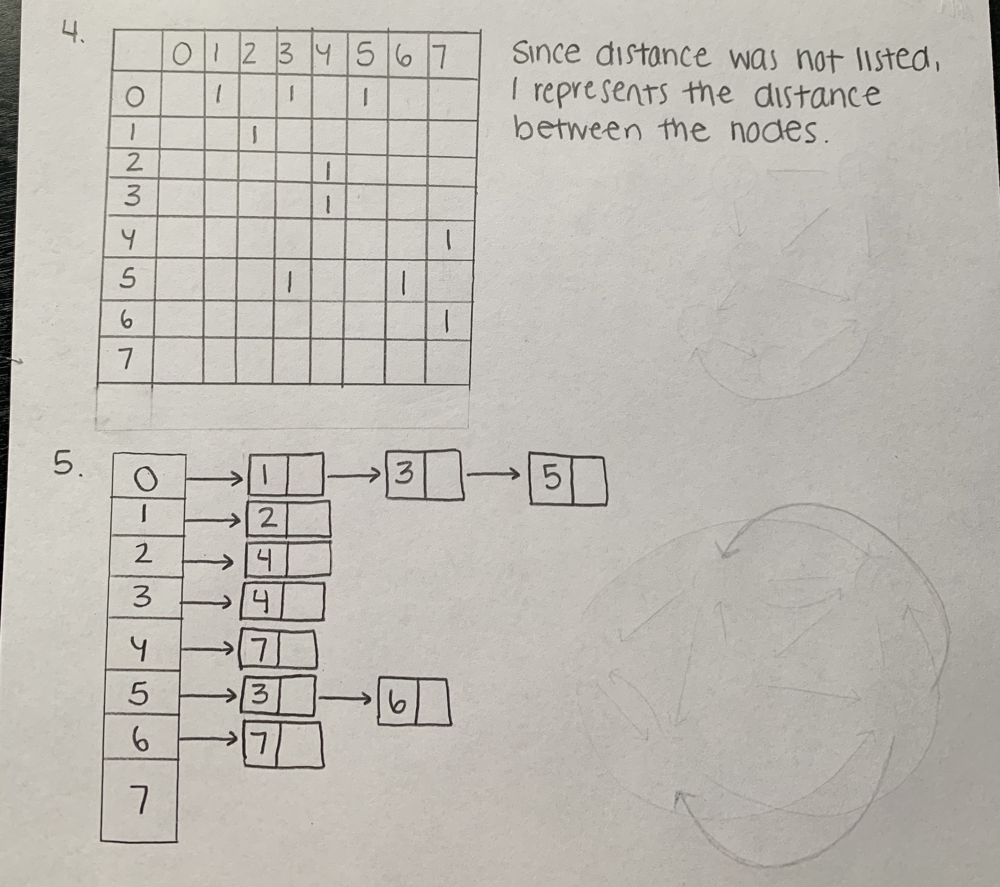
</div>

<div>
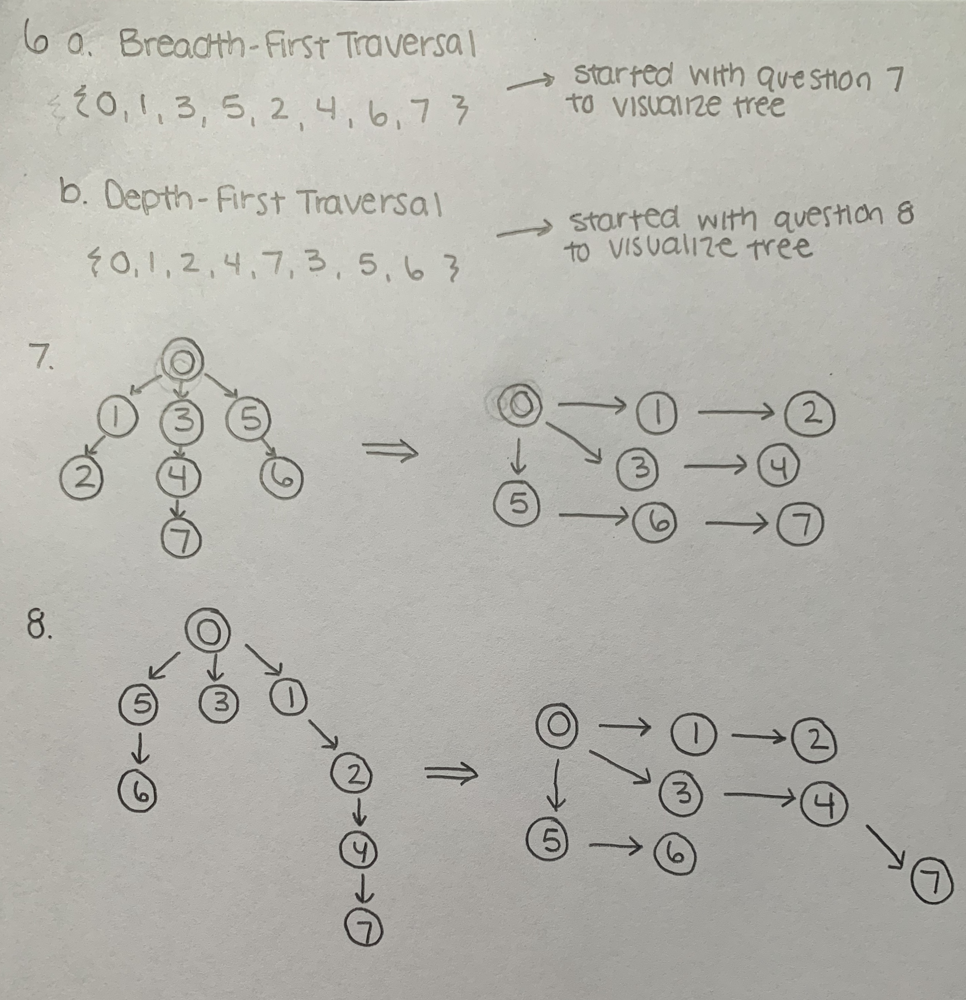
</div>

9. For both BFS and DFS, ($V^2$) is the time complexity in the adjacency matrix. In order to find the edges adjacent to the vertices, we need to traverse through the entire array. Therefore, each position in the matrix is visted once. 
   For both BFS and DFS, O(V+E) is the time complexity in the adjacency list. Since the list is a linked list of vertices to their corresponding edges, each postion is visted once through its own list. 
   - V represents the number of vertices and E represents the number of edges.  

10. shortest path: 

<div>
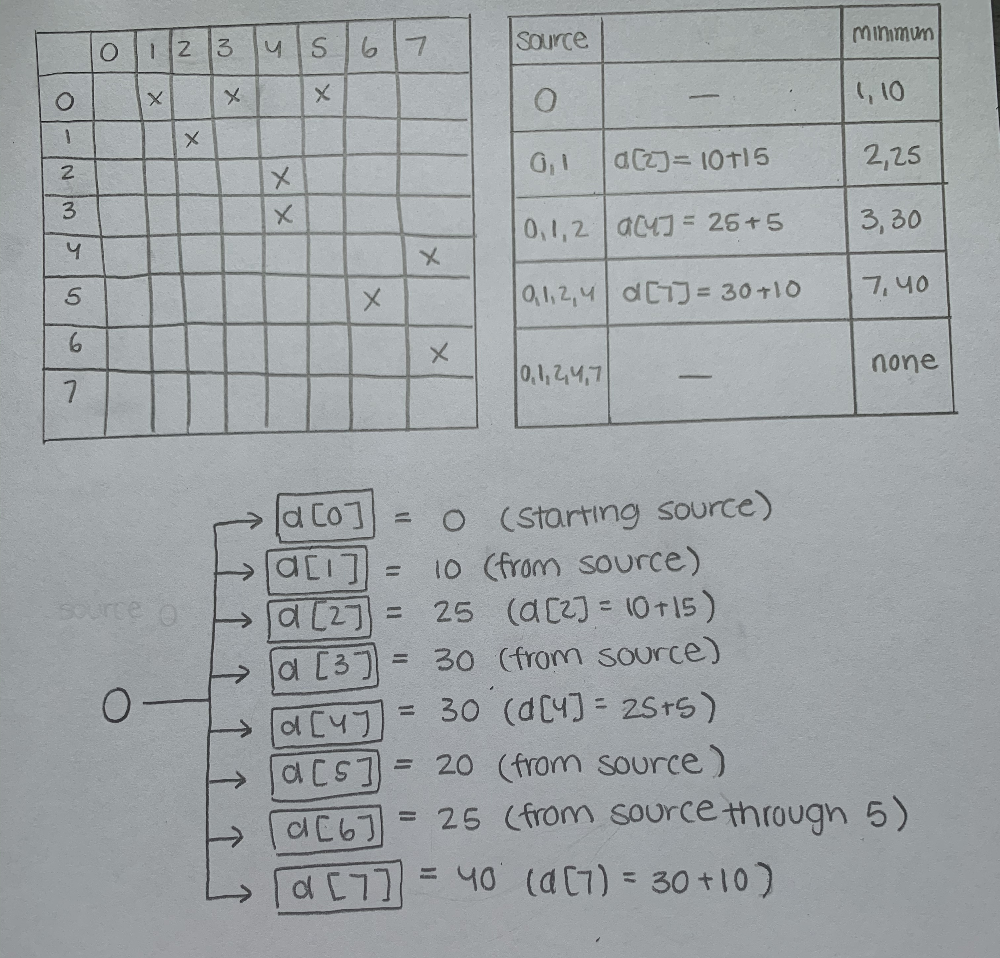
</div>

<img src="https://raw.githubusercontent.com/gsprint23/cpts215/master/microassignments/figures/ma7_weighted_digraph.png" width="400"/>
1. (4 pts) For the following weighted graph, find the minimum spanning tree:

<img src="https://raw.githubusercontent.com/gsprint23/cpts215/master/microassignments/figures/ma7_weighted_graph.png" width="400"/>

<div>
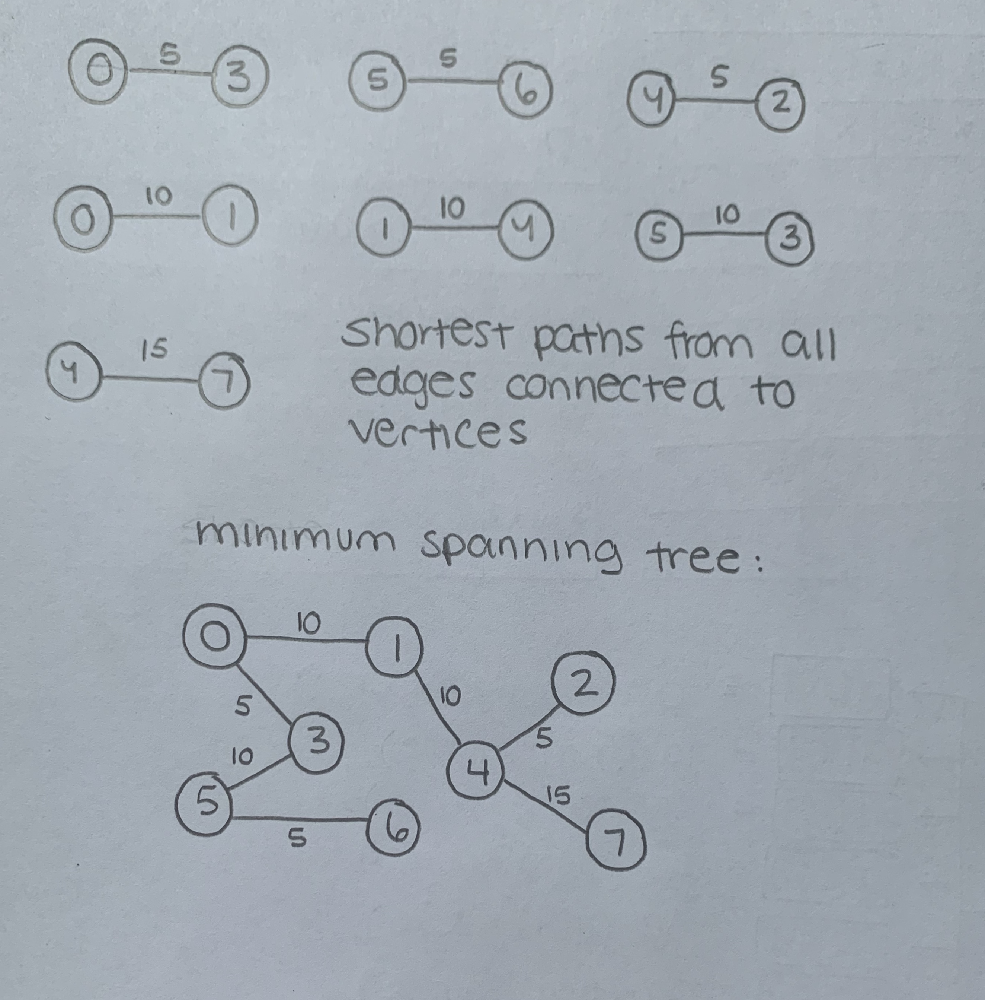
</div>

1. (2 pts) What is the time complexity for Prim's minimum spanning tree problem?

O((V+E)log(V)) because the insertion in the queue requires logarithmic time and each vertice is inserted into the queue. 

### Implementation Question
In CptS 121/131 you learned how to write a recursive function to solve a solution through a maze. The maze was represented as a 2 dimensional array of cells. Each cell was either open or an "X", which represented a wall. The solution you derived was a backtracking algorithm that tried many different paths (probably something like right, down, left, up). If the algorithm hit a dead end it would back track, trying a different path. The solution of the backtracking algorithm was not optimal. Using graphs, we can find the shortest path from the start point to the end point.

We can represent a maze as a graph by adding a vertex for the start, the end, each decision point (i.e. an intersection), and a vertex for each dead end. The edges represent connections in the maze between locations (our graph vertices). Each edge will be unweighted, meaning we are ignoring the length of the connection in terms of the number of cells in the maze. 

Define a 16x16 semi-difficult maze. Include your maze as an image in your notebook, code it up as a 2D list, or visualize it using matplotlib. Construct a graph from your maze. Find the shortest path from the start vertex to the end vertex using a breadth-first search. The shortest path will represent the fewest number of vertices (decision points) in the graph, not the shortest distance in terms of the number of cells along the path. Display the shortest path and the number of decision points in the path.

<div>
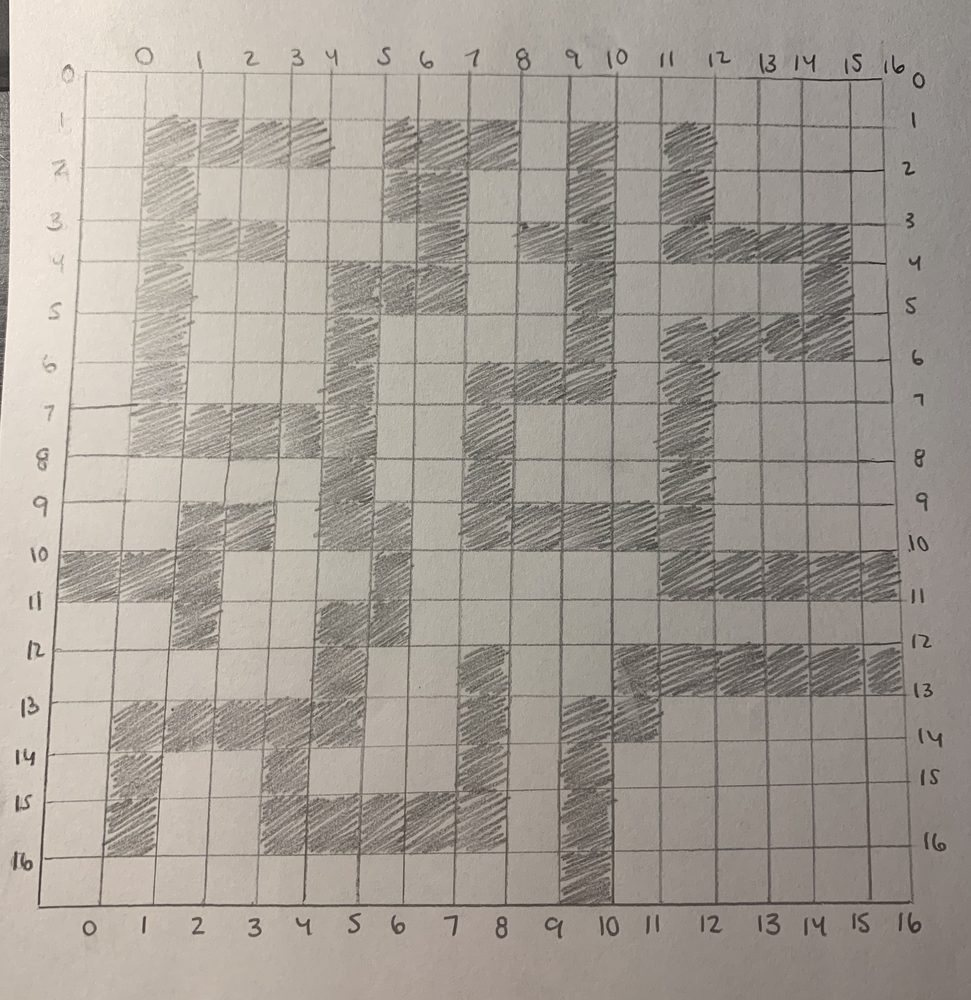
</div>

<div>
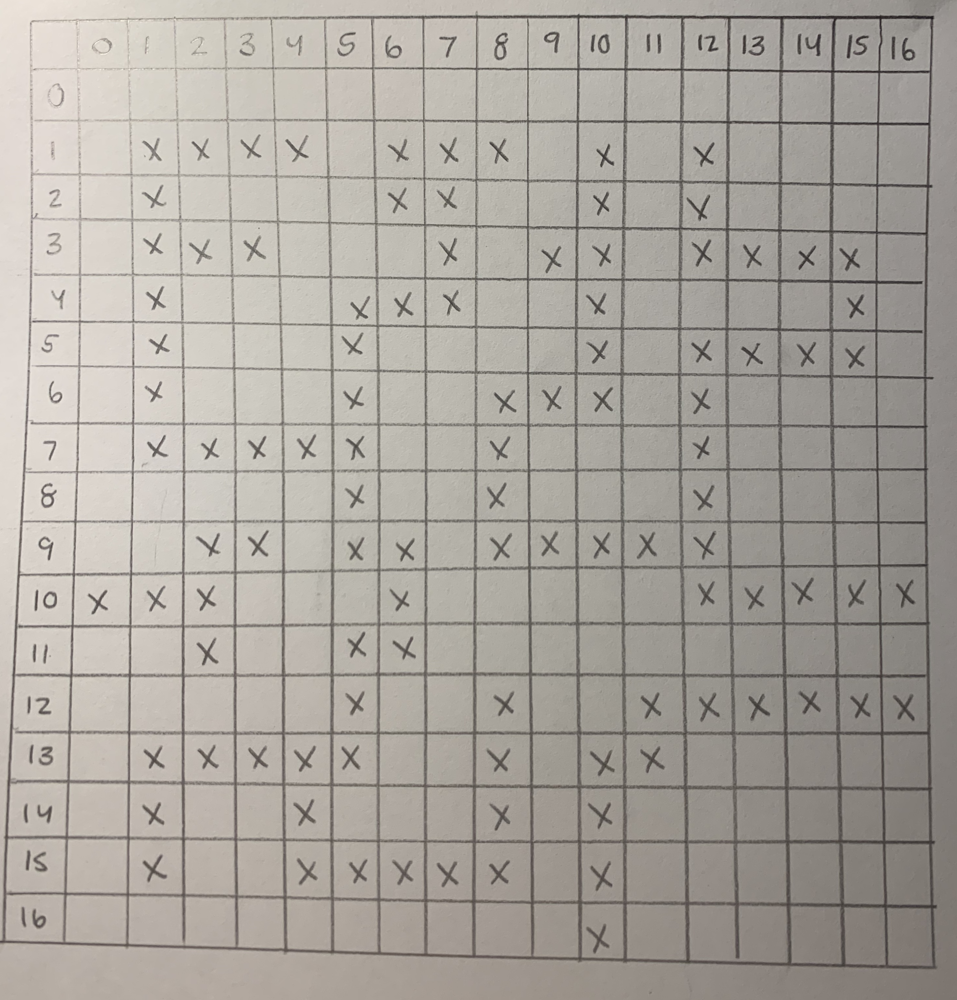
</div>

In [11]:
from collections import defaultdict

class Graph:  
    def __init__(self):
        '''
        it provides a default value for the
        given key. This value is inserted in
        the dictionary for the key, and then
        returned.
        '''
        self.graph = defaultdict(list)

    def add_edge(self, vertice, edge):
        '''
        Creates the structure for the graph by
        adding an edge and then appending a 
        vertice to connect the vertices (nodes)
        together. 
        '''
        self.graph[edge].append(vertice)
    
    def breadth_first_search(self, start_node, end_node):
        '''
        To find the shortest path, we use breadth 
        first search which requires a directed graph
        and an empty queue. We use first in first 
        out method (FIFO) in order to find the shortest
        path of edges to vertices. 
        '''
        Q = [[start_node]]
        T = []
        
        while Q:
            v_des = Q.pop(0)
            v_src = v_des[-1]
            
            if v_src not in T:
                nbrs = self.graph[v_src]
                
                for edge in nbrs:
                    new_des = list(v_des)
                    new_des.append(edge)
                    Q.append(new_des)
                
                    if edge == end_node:
                        return new_des

                T.append(v_src)

        return print('Path does not exist, try again.')
    
g = Graph()
g.add_edge(1,1)
g.add_edge(1,2)
g.add_edge(1,3)
g.add_edge(1,4)
g.add_edge(1,6)
g.add_edge(1,7)
g.add_edge(1,8)
g.add_edge(1,10)
g.add_edge(1,12)
g.add_edge(2,1)
g.add_edge(2,6)
g.add_edge(2,7)
g.add_edge(2,8)
g.add_edge(2,10)
g.add_edge(3,12)
g.add_edge(3,1)
g.add_edge(3,2)
g.add_edge(3,3)
g.add_edge(3,7)
g.add_edge(3,9)
g.add_edge(3,10)
g.add_edge(3,12)
g.add_edge(3,13)
g.add_edge(3,14)
g.add_edge(3,15)
g.add_edge(4,1)
g.add_edge(4,5)
g.add_edge(4,6)
g.add_edge(4,7)
g.add_edge(4,10)
g.add_edge(4,15)
g.add_edge(5,1)
g.add_edge(5,5)
g.add_edge(5,10)
g.add_edge(5,12)
g.add_edge(5,13)
g.add_edge(5,14)
g.add_edge(5,15)
g.add_edge(6,1)
g.add_edge(6,5)
g.add_edge(6,8)
g.add_edge(6,9)
g.add_edge(6,10)
g.add_edge(6,12)
g.add_edge(7,1)
g.add_edge(7,2)
g.add_edge(7,3)
g.add_edge(7,4)
g.add_edge(7,5)
g.add_edge(7,8)
g.add_edge(7,12)
g.add_edge(8,5)
g.add_edge(8,8)
g.add_edge(8,12)
g.add_edge(9,2)
g.add_edge(9,3)
g.add_edge(9,5)
g.add_edge(9,6)
g.add_edge(9,8)
g.add_edge(9,9)
g.add_edge(9,10)
g.add_edge(9,11)
g.add_edge(9,12)
g.add_edge(10,0)
g.add_edge(10,1)
g.add_edge(10,2)
g.add_edge(10,6)
g.add_edge(10,12)
g.add_edge(10,13)
g.add_edge(10,14)
g.add_edge(10,15)
g.add_edge(10,16)
g.add_edge(11,2)
g.add_edge(11,5)
g.add_edge(11,6)
g.add_edge(12,5)
g.add_edge(12,8)
g.add_edge(12,11)
g.add_edge(12,12)
g.add_edge(12,13)
g.add_edge(12,14)
g.add_edge(12,15)
g.add_edge(12,16)
g.add_edge(13,1)
g.add_edge(13,2)
g.add_edge(13,3)
g.add_edge(13,4)
g.add_edge(13,5)
g.add_edge(13,8)
g.add_edge(13,10)
g.add_edge(13,11)
g.add_edge(14,1)
g.add_edge(14,4)
g.add_edge(14,8)
g.add_edge(14,10)
g.add_edge(15,1)
g.add_edge(15,4)
g.add_edge(15,5)
g.add_edge(15,6)
g.add_edge(15,7)
g.add_edge(15,8)
g.add_edge(15,10)
g.add_edge(16,10)

print(g.breadth_first_search(0, 16))

[0, 10, 16]


## Bonus (4 pts)
Read about [topological sorting](https://runestone.academy/runestone/books/published/pythonds/Graphs/TopologicalSorting.html). Show a topological sort for the unweighted directed graph of question 3. 

## Submitting Assignments
1.	Use the Blackboard tool https://learn.wsu.edu to submit your assignment. You will submit your code to the corresponding programming assignment under the "Content" tab. You must upload your solutions as `<your last name>_ma5.zip` by the due date and time.
2.	Your .zip file should contain your .ipynb file and a .html file representing your Notebook as a webpage (File->Download as->HTML).

## Grading Guidelines
This assignment is worth 50 points + 4 points bonus. Your assignment will be evaluated based on a successful compilation and adherence to the program requirements. We will grade according to the following criteria:
* 34 pts for answering the conception questions
* 12 pts for correct implementation of the maze solver
    * 2 pts for visualizing the maze
    * 2 pts for constructing a graph to represent the maze
    * 4 pts for correct shortest path computation
    * 4 pts for displaying the results (visualizing the shortest path and the number of decision points)
* 4 pts for for adherence to proper programming style and comments established for the class